## Removed all bad L2 sims at M=12.3:

In [1]:
import importlib
from gal_goku import plot
importlib.reload(plot)
data_dir = '/home/qezlou/HD2/HETDEX/cosmo/data/xi_on_grid/'
train_subdir = 'train_remove_bad_l2_sims'

plot_xi_emu = plot.PlotXiEmu(data_dir=data_dir, train_subdir=train_subdir)

2025-09-02 10:19:27.192920: I external/local_xla/xla/tsl/cuda/cudart_stub.cc:32] Could not find cuda drivers on your machine, GPU will not be used.
2025-09-02 10:19:27.196308: I external/local_xla/xla/tsl/cuda/cudart_stub.cc:32] Could not find cuda drivers on your machine, GPU will not be used.
2025-09-02 10:19:27.205940: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:467] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
E0000 00:00:1756826367.221471 1878646 cuda_dnn.cc:8579] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
E0000 00:00:1756826367.226276 1878646 cuda_blas.cc:1407] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
W0000 00:00:1756826367.239046 1878646 computation_placer.cc:177] computation placer already registered. Please check linkage and avoid linkin

Using 10 cores for parallel processing


2025-09-02 10:19:32.859277: E external/local_xla/xla/stream_executor/cuda/cuda_platform.cc:51] failed call to cuInit: INTERNAL: CUDA error: Failed call to cuInit: UNKNOWN ERROR (303)
2025-09-02 10:19:32.968778: E external/local_xla/xla/stream_executor/cuda/cuda_platform.cc:51] failed call to cuInit: INTERNAL: CUDA error: Failed call to cuInit: UNKNOWN ERROR (303)
2025-09-02 10:19:33.085863: E external/local_xla/xla/stream_executor/cuda/cuda_platform.cc:51] failed call to cuInit: INTERNAL: CUDA error: Failed call to cuInit: UNKNOWN ERROR (303)
2025-09-02 10:19:33.195520: E external/local_xla/xla/stream_executor/cuda/cuda_platform.cc:51] failed call to cuInit: INTERNAL: CUDA error: Failed call to cuInit: UNKNOWN ERROR (303)
2025-09-02 10:19:33.357860: E external/local_xla/xla/stream_executor/cuda/cuda_platform.cc:51] failed call to cuInit: INTERNAL: CUDA error: Failed call to cuInit: UNKNOWN ERROR (303)
2025-09-02 10:19:33.603163: E external/local_xla/xla/stream_executor/cuda/cuda_platfo

In [7]:
import numpy as np
np.where(plot_xi_emu.sim_tags == 'compressed_10p_Box1000_Part3000_0522')

(array([18]),)

In [2]:
plot_xi_emu.sim_tags[18], plot_xi_emu.sim_tags[20], plot_xi_emu.sim_tags[6]

(np.str_('compressed_10p_Box1000_Part3000_0522'),
 np.str_('compressed_10p_Box1000_Part3000_0524'),
 np.str_('compressed_10p_Box1000_Part3000_0072'))

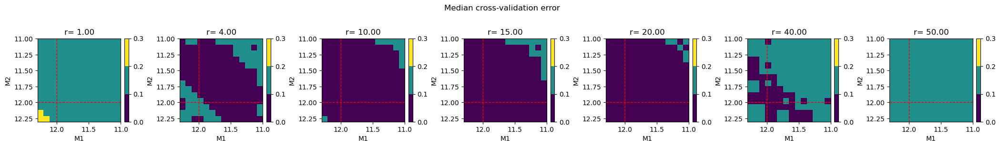

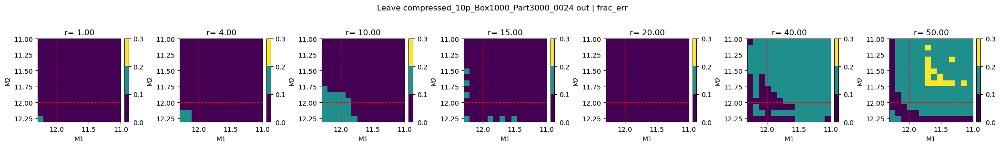

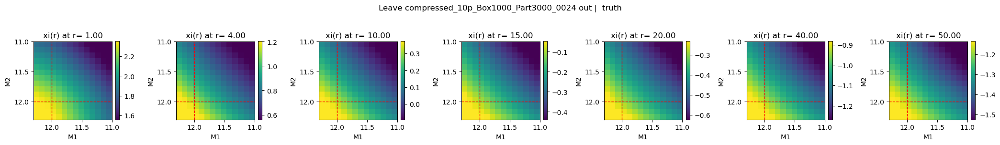

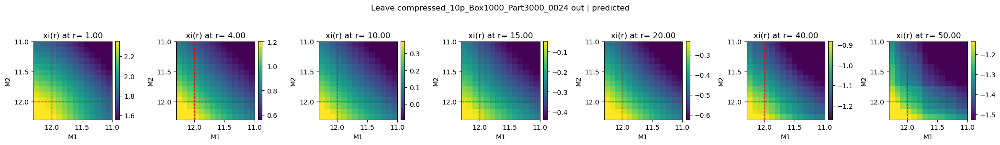

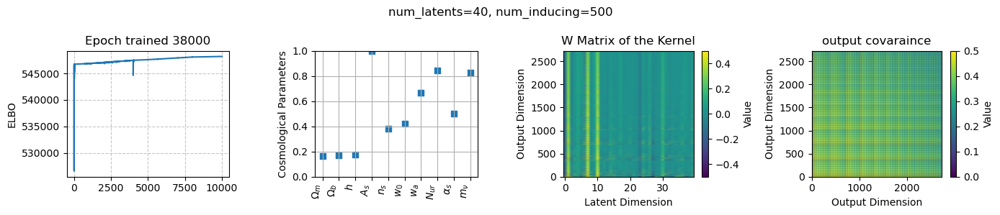

...

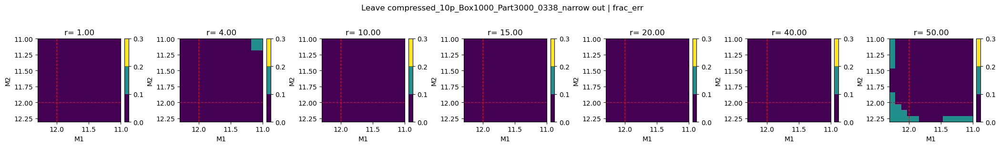

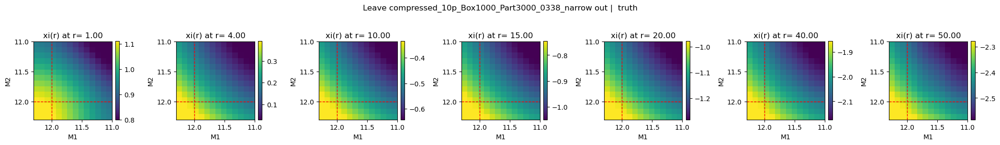

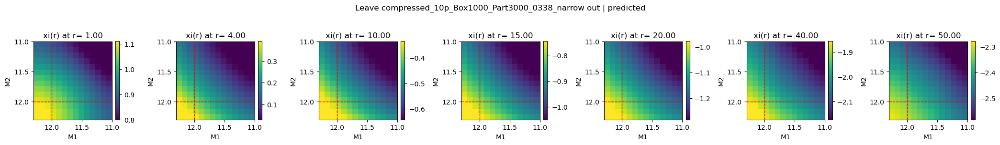

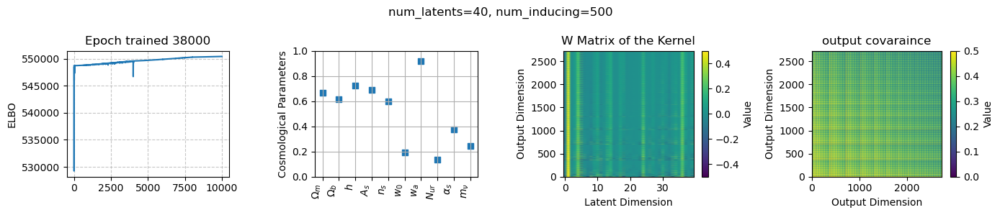

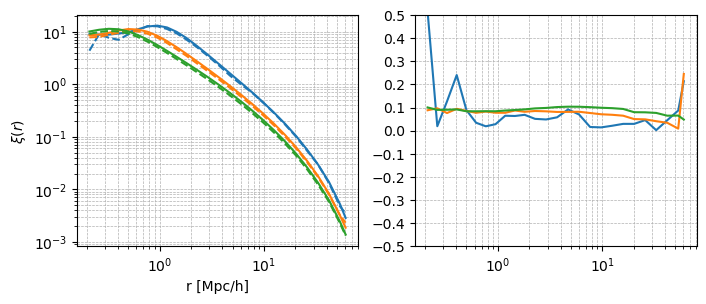

In [4]:
plot_xi_emu.cross_valid_2d_errs(mass_range=(12.3, 11.0))

In [6]:
import numpy as np
# params of interest
indp = [0, 2, 3, 4]
dist = np.abs(plot_xi_emu.dist_planck)
print(dist.shape)
ind_sims = np.arange(dist.shape[0])
outlier_sims = []
for p in indp:
    percent = np.percentile(dist[:,p], [80])
    ind_above = np.where(dist[:,p] >= percent[0])
    print(f"Parameter {list(plot_xi_emu.latex_labels.keys())[p]}: {len(ind_above[0])} simulations above 80th percentile of {percent}, sims= {ind_above}")
    print(dist[ind_above, p])
    outlier_sims.extend(ind_above)
outlier_sims = np.unique(np.array(outlier_sims))
remaining_sims = np.setdiff1d(ind_sims, outlier_sims)
print(f"Total number of outlier simulations: {len(outlier_sims)}")
print(f"Remaining simulations after removing outliers: {len(remaining_sims)}")
print(f'outlier_sims: {outlier_sims}')

(36, 10)
Parameter omega0: 8 simulations above 80th percentile of [11.06071429], sims= (array([ 0,  5,  6, 11, 14, 17, 18, 20]),)
[[11.06071429 12.125      14.275      12.89642857 14.31071429 12.16785714
  15.94642857 11.69642857]]
Parameter hubble: 8 simulations above 80th percentile of [12.62563323], sims= (array([ 5,  7, 10, 16, 18, 19, 29, 32]),)
[[13.53968254 17.75555556 13.69206349 16.02857143 14.35238095 16.12380952
  14.22982101 12.62563323]]
Parameter scalar_amp: 8 simulations above 80th percentile of [18.12222222], sims= (array([ 0,  1,  5,  9, 10, 12, 16, 20]),)
[[29.52222222 35.01111111 18.94444444 28.36666667 18.12222222 25.5
  21.94444444 24.25555556]]
Parameter ns: 8 simulations above 80th percentile of [26.13157895], sims= (array([ 1,  2,  3,  6,  7, 13, 15, 20]),)
[[28.97368421 43.55263158 28.23684211 34.81578947 26.13157895 29.55263158
  42.60526316 36.18421053]]
Total number of outlier simulations: 21
Remaining simulations after removing outliers: 15
outlier_sims: [ 

(36, 26)
[(np.int64(13), np.str_('compressed_10p_Box1000_Part3000_0241')), (np.int64(15), np.str_('compressed_10p_Box1000_Part3000_0300')), (np.int64(18), np.str_('compressed_10p_Box1000_Part3000_0522'))]


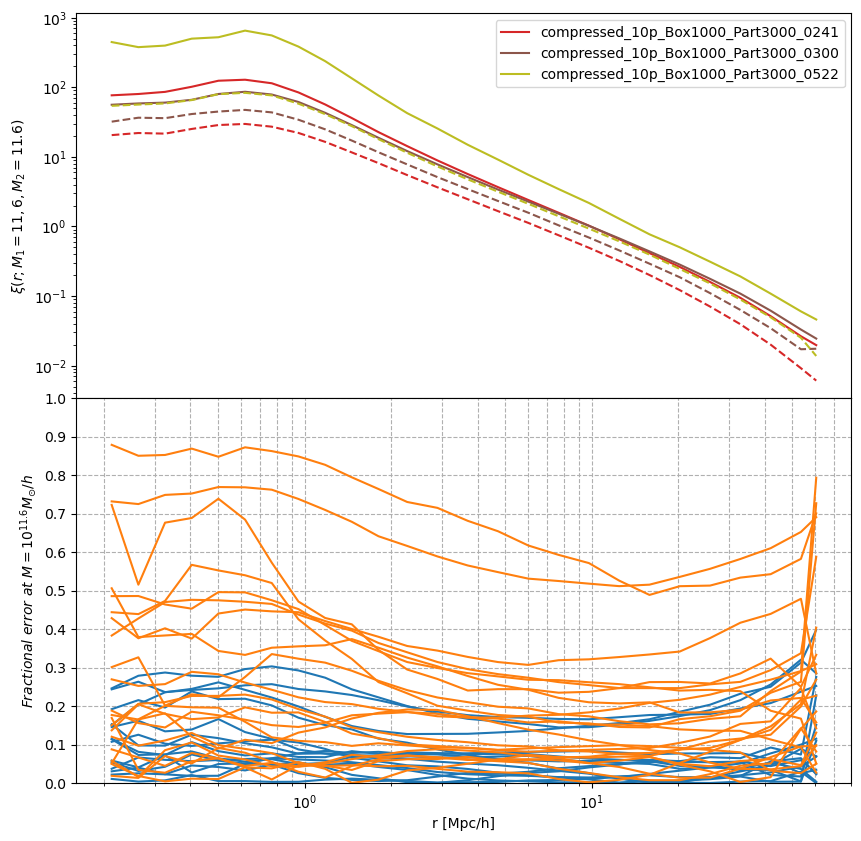

In [7]:
import matplotlib.pyplot as plt
import numpy as np


fig, ax = plt.subplots(2, 1, figsize=(10, 10), sharex=True, sharey=False, gridspec_kw={'hspace': 0, 'height_ratios': [1, 1]})
mass_bins = np.unique(plot_xi_emu.emu.mbins[:,0])[::-1]

indm = 7
frac_errs = plot_xi_emu.frac_errs[:,indm, indm,:]
print(frac_errs.shape)


ind = np.where(np.all(frac_errs[:,0:-4] > 0.3, axis=1))[0]
print([(i, plot_xi_emu.sim_tags[i]) for i in ind])

for i in ind:
    ax[0].plot(plot_xi_emu.rbins, plot_xi_emu.truth[i,indm, indm,:], color=f'C{i}', alpha=1, label=plot_xi_emu.sim_tags[i])
    ax[0].plot(plot_xi_emu.rbins, plot_xi_emu.pred[i,indm, indm,:], color=f'C{i}', alpha=1, ls='--')
ax[0].set_xscale('log')
ax[0].set_yscale('log')
ax[0].set_ylabel(r'$\xi(r; M_1=11,6, M_2=11.6)$')
#ax[0].grid(which='both', linestyle='--', linewidth=0.8)
ax[0].legend(loc='upper right')


for i in remaining_sims:
    ax[1].plot(plot_xi_emu.rbins, frac_errs[i,:], color='C0', alpha=1)
for i in outlier_sims:
    ax[1].plot(plot_xi_emu.rbins, frac_errs[i,:], color='C1', alpha=1)

#ax[1].set_title(f'Mass bin {mass_bins[indm]}')
ax[1].set_xscale('log')
ax[1].grid(which='both', linestyle='--', linewidth=0.8)
ax[1].set_ylim(0, 1)
ax[1].set_yticks(np.arange(0, 1.1, 0.1))
ax[1].legend(loc='upper left')
ax[1].set_ylabel(r'$Fractional \ error \ at  \ M = 10^{11.6} M_{\odot}/h$')
ax[1].set_xlabel('r [Mpc/h]')
ax[1].legend(frameon=False, loc='upper right')





In [11]:
import numpy as np
np.tile(np.arange(3), 4)

array([0, 1, 2, 0, 1, 2, 0, 1, 2, 0, 1, 2])

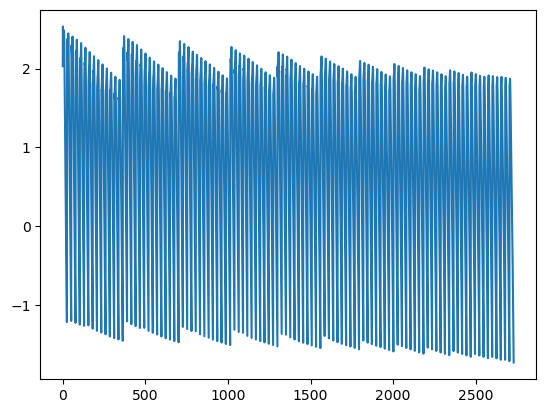

In [9]:
from matplotlib import pyplot as plt

plt.plot(plot_xi_emu.emu.Y[1][0])


Lert;s check the KL deivergence which should not collapse to a very small value, otherwise the latenst space wpuld be useless for prediction:


In [6]:
import pickle
with open('/home/qezlou/HD2/HETDEX/cosmo/data/xi_on_grid/train_remove_bad_l2_sims_test_kl_reg/xi_emu_combined_inducing_500_latents_40_leave0.pkl.attrs','rb') as f:
    attrs = pickle.load(f)

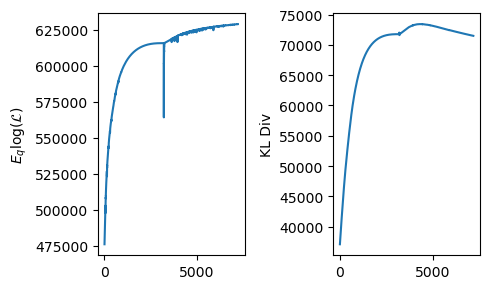

In [7]:
from matplotlib import pyplot as plt
import numpy as np
fig, ax = plt.subplots(1,2, figsize=(5,3))
kl_history =  np.array(attrs['kl_history'][800:])
recon = -np.array(attrs['loss_history'][800:]) + kl_history
ax[0].plot(recon)
ax[1].plot(kl_history)
ax[0].set_ylabel(r'$E_q \log(\mathcal{L})$')
ax[1].set_ylabel(f'KL Div')
fig.tight_layout()


## Check $\beta = 0.1$ for sim 522:

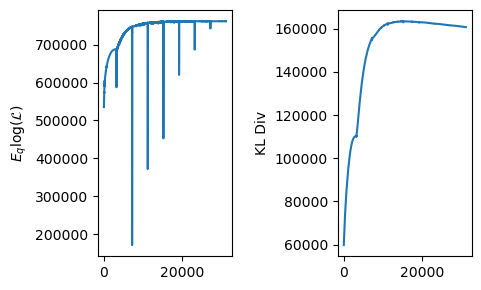

In [3]:
import pickle
with open('/home/qezlou/HD2/HETDEX/cosmo/data/xi_on_grid/train_remove_bad_l2_sims_test_kl_reg/xi_emu_combined_inducing_500_latents_40_leave18.pkl.attrs','rb') as f:
    attrs = pickle.load(f)

from matplotlib import pyplot as plt
import numpy as np
fig, ax = plt.subplots(1,2, figsize=(5,3))
kl_history =  np.array(attrs['kl_history'][800:])
recon = -np.array(attrs['loss_history'][800:]) + kl_history
ax[0].plot(recon)
ax[1].plot(kl_history)
ax[0].set_ylabel(r'$E_q \log(\mathcal{L})$')
ax[1].set_ylabel(f'KL Div')
fig.tight_layout()


In [1]:
import importlib
from gal_goku import plot
importlib.reload(plot)
import numpy as np
data_dir = '/home/qezlou/HD2/HETDEX/cosmo/data/xi_on_grid/'
train_subdir = 'train_remove_bad_l2_sims_test_kl_reg'

plot_xi_emu = plot.PlotXiEmu(data_dir=data_dir, train_subdir=train_subdir, eval_loo=False)
plot_xi_emu.truth, plot_xi_emu.pred, plot_xi_emu.w_matrices, plot_xi_emu.loss_hist = [], [], [], []
pred, truth, loss_hist, w = plot_xi_emu._predict_and_calculate_error(s=18, y_err_th = 1)
plot_xi_emu.pred.append(pred)
plot_xi_emu.truth.append(truth)
plot_xi_emu.w_matrices.append(w)
plot_xi_emu.loss_hist.append(loss_hist)
plot_xi_emu.frac_errs = []
plot_xi_emu.frac_errs.append(np.abs(pred/truth - 1))
plot_xi_emu.sim_tags = [plot_xi_emu.sim_tags[18]]



2025-09-02 18:22:29.412173: I external/local_xla/xla/tsl/cuda/cudart_stub.cc:32] Could not find cuda drivers on your machine, GPU will not be used.
2025-09-02 18:22:29.415547: I external/local_xla/xla/tsl/cuda/cudart_stub.cc:32] Could not find cuda drivers on your machine, GPU will not be used.
2025-09-02 18:22:29.425544: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:467] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
E0000 00:00:1756855349.441469 1894632 cuda_dnn.cc:8579] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
E0000 00:00:1756855349.446266 1894632 cuda_blas.cc:1407] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
W0000 00:00:1756855349.459380 1894632 computation_placer.cc:177] computation placer already registered. Please check linkage and avoid linkin

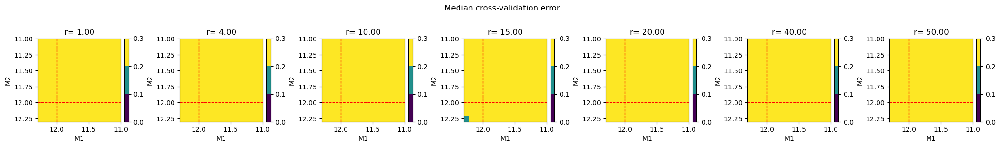

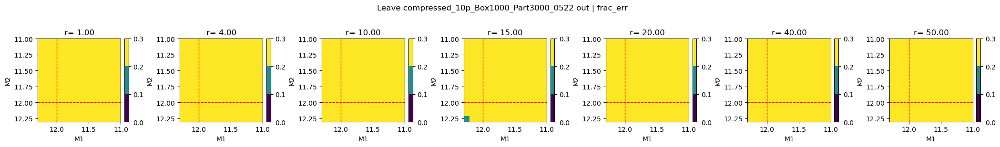

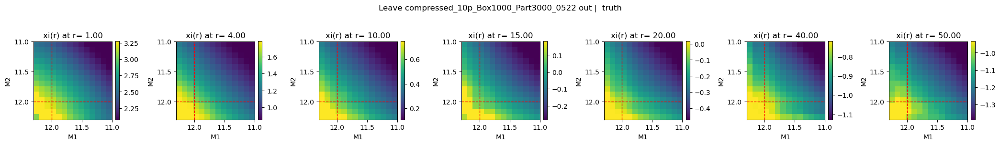

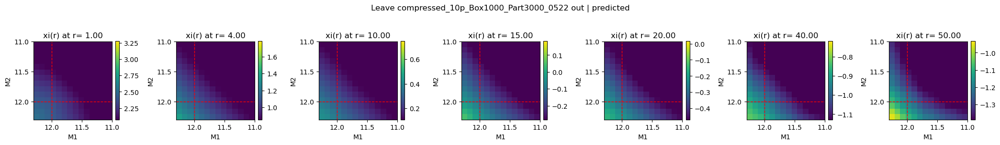

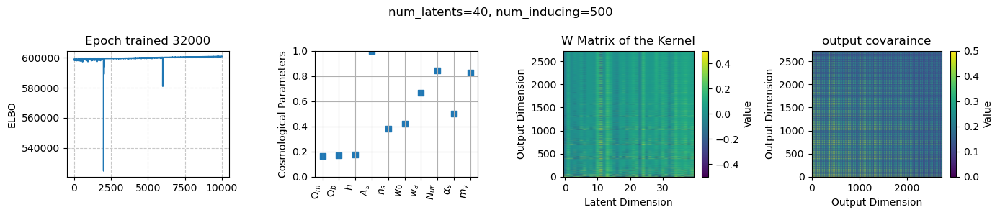

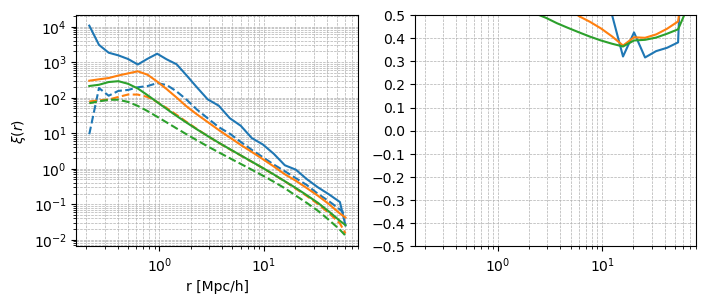

In [2]:
plot_xi_emu.cross_valid_2d_errs(mass_range=(12.3, 11.0))

Did not help much.